# Import Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip -qq /content/drive/MyDrive/milk_3.zip

In [ ]:
!unzip -qq /content/drive/MyDrive/23.11.2021_1500_images_russian_stores.zip -d 23.11.2021_1500_images_russian_stores

In [ ]:
import json
import os
import shutil
import cv2
from tqdm import tqdm
import pathlib
import tensorflow as tf

In [ ]:
def copy_and_overwrite(from_path, to_path):
    if os.path.exists(to_path):
        shutil.rmtree(to_path)
    shutil.copytree(from_path, to_path)


def remove_class(json_contents, class_name='Плохой bbox'):
    for categorie in json_contents['categories']:
        if categorie['name'] == class_name:
            class_remove_id = categorie['id']
            class_remove_name = categorie['name']
            break
        
    json_contents['categories'] = [obj for obj in json_contents['categories'] \
                                   if obj['name'] != class_remove_name]
    json_contents['annotations'] = [obj for obj in json_contents['annotations'] \
                                    if obj['category_id'] != class_remove_id]
    
    return json_contents


def resize_dataset(dataset_dir, output_dataset_dir, target_height):
    copy_and_overwrite(dataset_dir, output_dataset_dir)

    with open(os.path.join(output_dataset_dir, 'result.json')) as json_fp:
        json_contents = json.load(json_fp)

    json_contents = remove_class(json_contents)

    for index, image_contents in enumerate(tqdm(json_contents['images'])):
        w, h = image_contents['width'], image_contents['height']
        
        image_path = str(os.path.join(output_dataset_dir, image_contents['file_name']))
        if not os.path.exists(image_path):  # if label-studio added some nonsence
            file_name = image_contents['file_name'].split(os.path.sep)
            image_contents['file_name'] = os.path.sep.join(file_name[:-2] + file_name[-1:])
            image_path = str(os.path.join(output_dataset_dir, image_contents['file_name']))

        image = cv2.imread(image_path)
        
        assert (h, w) == image.shape[:2], f'image shape is not same as the notation says, {image.shape[:2]}'
        
        target_width = int(w / (h / target_height))
        image_resized = cv2.resize(image, (target_width, target_height), interpolation=cv2.INTER_AREA)

        cv2.imwrite(image_path, image_resized)
        image_contents['width'] = target_width
        image_contents['height'] = target_height
        json_contents['images'][index] = image_contents
        for annotation_index, annotation in enumerate(json_contents['annotations']):
            if annotation['image_id'] == image_contents['id']:
                annotation['bbox'][0] = int(round(annotation['bbox'][0] / w * target_width))
                annotation['bbox'][1] = int(round(annotation['bbox'][1] / h * target_height))
                annotation['bbox'][2] = int(round(annotation['bbox'][2] / w * target_width))
                annotation['bbox'][3] = int(round(annotation['bbox'][3] / h * target_height))
                annotation['area'] = annotation['bbox'][1] * annotation['bbox'][3]
        
    with open(os.path.join(output_dataset_dir, 'result.json'), 'w') as json_fp:
        json.dump(json_contents, json_fp, indent=4)


resize_dataset(dataset_dir='milk_3', 
               output_dataset_dir='val', 
               target_height=640)
resize_dataset(dataset_dir='23.11.2021_1500_images_russian_stores', 
               output_dataset_dir='train', 
               target_height=640)

100%|██████████| 1457/1457 [00:55<00:00, 26.16it/s]


In [ ]:
train_json = '/content/train/result.json'
val_json = '/content/val/result.json'

with open(val_json) as val_json_fp, open(train_json) as train_json_fp:
    val_json_contents = json.load(val_json_fp)
    train_json_contents = json.load(train_json_fp)

    assert all(item in train_json_contents['categories'] 
               for item in val_json_contents['categories'])

    val_json_contents['categories'] = train_json_contents['categories']

with open(val_json, 'w') as val_json_fp:
    json.dump(val_json_contents, val_json_fp, indent=4)

In [ ]:
def remove_multiclass(annotation_json):
    with open(annotation_json) as json_fp:
        json_contents = json.load(json_fp)

    for annotation in json_contents['annotations']:
        annotation['category_id'] = 0

    json_contents['categories'] = [{'id': 0, 'name': 'box'}]

    with open(annotation_json, 'w') as json_fp:
        json.dump(json_contents, json_fp, indent=4)


remove_multiclass('/content/train/result.json')
remove_multiclass('/content/val/result.json')

In [ ]:
# !pip install pylabel
from pylabel import importer
dataset = importer.ImportCoco(path='/content/val/result.json', path_to_images='/content/val/images')
dataset.export.ExportToYoloV5('/content/val')


['/content/dataset.yaml',
 '/content/val/images/dcc75cd8-IMG_20210928_130724.txt',
 '/content/val/images/2fdf1fcd-IMG_20210928_130858.txt',
 '/content/val/images/7bd21385-IMG_20210928_130407.txt',
 '/content/val/images/cae7b400-IMG_20210928_130621.txt',
 '/content/val/images/a42fd8f2-IMG_20210928_131016.txt',
 '/content/val/images/640a57fc-IMG-20210929-WA0051.txt',
 '/content/val/images/363ce2d2-IMG-20210929-WA0072.txt',
 '/content/val/images/07b677fe-IMG_20210930_132419.txt',
 '/content/val/images/d19f5618-IMG_20210930_132426.txt',
 '/content/val/images/68a5b142-IMG_20210930_132811.txt',
 '/content/val/images/411fcfbd-IMG-20211001-WA0020.txt',
 '/content/val/images/1f428a1a-IMG_20211002_121945.txt',
 '/content/val/images/af87ff5d-IMG_20211002_122008.txt',
 '/content/val/images/94368bca-IMG_20211002_122026.txt',
 '/content/val/images/ea57aca3-IMG_20211002_122109.txt',
 '/content/val/images/e269a4b6-IMG_20211003_145109.txt',
 '/content/val/images/71571f5f-IMG_20211003_145131.txt',
 '/co

In [ ]:
?dataset.export

#Install TF

In [ ]:
# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3154, done.
remote: Counting objects: 100% (3154/3154), done.
remote: Compressing objects: 100% (2481/2481), done.
remote: Total 3154 (delta 837), reused 1508 (delta 629), pack-reused 0
Receiving objects: 100% (3154/3154), 33.37 MiB | 26.47 MiB/s, done.
Resolving deltas: 100% (837/837), done.


In [ ]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

# Data prep start

In [ ]:
!pip install opencv-python-headless==4.1.2.30

     |████████████████████████████████| 21.8 MB 7.6 MB/s 
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.5.5.62
    Uninstalling opencv-python-headless-4.5.5.62:
      Successfully uninstalled opencv-python-headless-4.5.5.62


In [ ]:
!python models/research/object_detection/dataset_tools/create_coco_tf_record.py \
--logtostderr \
--train_image_dir=/content/train \
--val_image_dir=/content/val \
--test_image_dir=/content/val \
--train_annotations_file=/content/train/result.json \
--val_annotations_file=/content/val/result.json \
--testdev_annotations_file=/content/val/result.json \
--output_dir=data

I0127 10:14:01.318320 140596977891200 create_coco_tf_record.py:399] Found groundtruth annotations. Building annotations index.
I0127 10:14:01.322075 140596977891200 create_coco_tf_record.py:412] 3 images are missing annotations.
I0127 10:14:01.322405 140596977891200 create_coco_tf_record.py:441] On image 0 of 1457
I0127 10:14:01.423148 140596977891200 create_coco_tf_record.py:441] On image 100 of 1457
I0127 10:14:01.563240 140596977891200 create_coco_tf_record.py:441] On image 200 of 1457
I0127 10:14:01.696559 140596977891200 create_coco_tf_record.py:441] On image 300 of 1457
I0127 10:14:01.818503 140596977891200 create_coco_tf_record.py:441] On image 400 of 1457
I0127 10:14:01.944464 140596977891200 create_coco_tf_record.py:441] On image 500 of 1457
I0127 10:14:02.084400 140596977891200 create_coco_tf_record.py:441] On image 600 of 1457
I0127 10:14:02.217333 140596977891200 create_coco_tf_record.py:441] On image 700 of 1457
I0127 10:14:02.475754 140596977891200 create_coco_tf_record.p

In [ ]:
%%bash

echo \
'item {
    id: 1
    name: "box"
}' > label_map.txt

# Data preparation FINISH

#MobileNet

In [ ]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20210210/centernet_mobilenetv2fpn_512x512_coco17_od.tar.gz
!tar xf centernet_mobilenetv2fpn_512x512_coco17_od.tar.gz

In [ ]:
%load_ext tensorboard

In [ ]:
!rm -rf model_dir
!mkdir model_dir 

In [ ]:
!python models/research/object_detection/model_main_tf2.py \
  --pipeline_config_path=/content/centernet_mobilenetv2_fpn_od/pipeline.config \
  --model_dir=/content/model_dir \
  --checkpoint_every_n=100 \
  --num_workers=2 \
  --alsologtostderr

In [ ]:
# python models/research/object_detection/model_main_tf2.py --pipeline_config_path=/content/centernet_mobilenetv2_fpn_od/pipeline.config --model_dir=/content/model_dir/ --checkpoint_dir=/content/model_dir --eval_timeout=10 --run_once=True --alsologtostderr

In [ ]:
# !cp -av "/content/centernet_mobilenetv2_fpn_od/pipeline.config" "/content/model_dir"
# !cp -av "/content/model_dir" "/content/drive/MyDrive/experimental/exp6"

In [ ]:
# %tensorboard --logdir=/content/model_dir

In [ ]:
!python models/research/object_detection/model_main_tf2.py \
  --pipeline_config_path=/content/centernet_mobilenetv2_fpn_od/pipeline.config \
  --model_dir=/content/model_dir \
  --checkpoint_dir=/content/model_dir \
  --eval_timeout=10 \
  --alsologtostderr

In [ ]:
!rm -rf exp_models
!mkdir exp_models

In [ ]:
!python models/research/object_detection/exporter_main_v2.py \
  --pipeline_config_path=/content/centernet_mobilenetv2_fpn_od/pipeline.config \
  --trained_checkpoint_dir=/content/model_dir \
  --output_directory=/content/exp_models \
  --input_type=image_tensor

In [ ]:
!python models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {'/content/exp_models/checkpoint'} \
    --output_directory {'exp_models/tflite'} \
    --pipeline_config_path {'/content/exp_models/pipeline.config'}

In [ ]:
converter = tf.lite.TFLiteConverter.from_saved_model('/content/exp_models/tflite/saved_model')
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_model = converter.convert()

with open('/content/exp_models/model.tflite', 'wb') as f:
  f.write(tflite_model)

#Visualization


In [ ]:
import numpy as np
import six.moves.urllib as urllib
import sys
import tarfile
import zipfile
import matplotlib
import matplotlib.pyplot as plt
import random
import io
import imageio
import glob
import scipy.misc

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from IPython.display import display
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

from object_detection.utils import config_util
from object_detection.utils import colab_utils
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import config_util
from object_detection.builders import model_builder
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util

%matplotlib inline

In [ ]:
model_dir = '/content/exp_models/saved_model'

detection_model = tf.saved_model.load(str(model_dir)) 
 
PATH_TO_LABELS = '/content/label_map.txt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [ ]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

def show_inference(model, image_path):
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = np.array(Image.open(image_path))


  # Actual detection.
    
  output_dict = run_inference_for_single_image(model, image_np)
  # Visualization of the results of a detection.
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)

  display(Image.fromarray(image_np))

/content/952673a7-IMG-20211001-WA0012.jpg


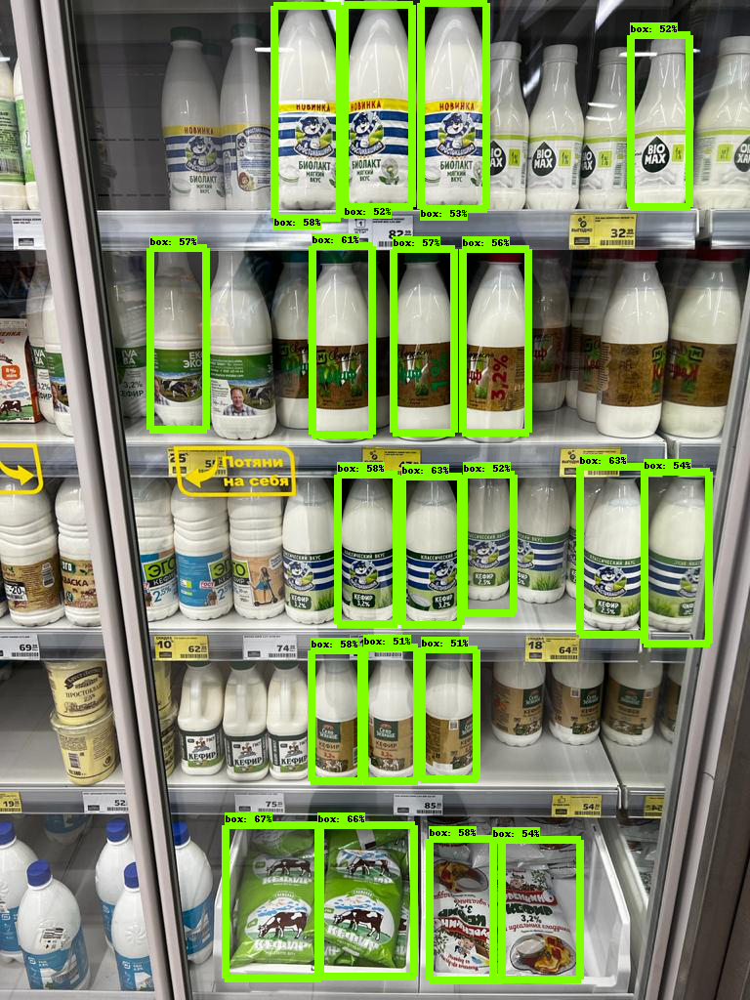

/content/IMG_11880091.jpg


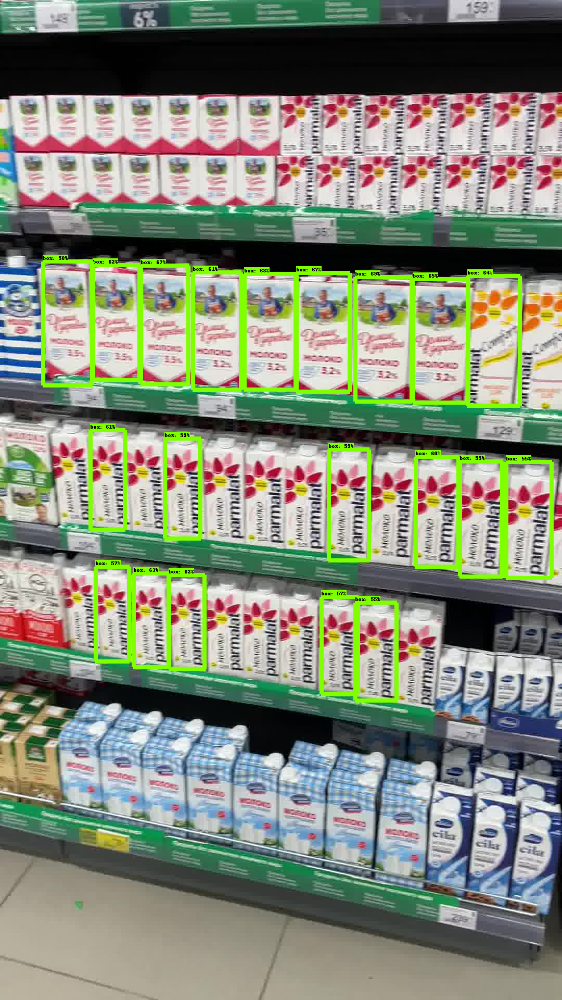

In [ ]:
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('/content')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))

for image_path in TEST_IMAGE_PATHS:
    print(image_path)
    show_inference(detection_model, image_path)


#TFLite Vis

In [ ]:
# Print the image we are going to test on as a sanity check.

def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [ ]:
def detect(interpreter, input_tensor, include_keypoint=False):
  """Run detection on an input image.

  Args:
    interpreter: tf.lite.Interpreter
    input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
      Note that height and width can be anything since the image will be
      immediately resized according to the needs of the model within this
      function.
    include_keypoint: True if model supports keypoints output. See
      https://cocodataset.org/#keypoints-2020

  Returns:
    A sequence containing the following output tensors:
      boxes: a numpy array of shape [N, 4]
      classes: a numpy array of shape [N]. Note that class indices are 
        1-based, and match the keys in the label map.
      scores: a numpy array of shape [N] or None.  If scores=None, then
        this function assumes that the boxes to be plotted are groundtruth
        boxes and plot all boxes as black with no classes or scores.
      category_index: a dict containing category dictionaries (each holding
        category index `id` and category name `name`) keyed by category 
        indices.
    If include_keypoints is True, the following are also returned:
      keypoints: (optional) a numpy array of shape [N, 17, 2] representing
        the yx-coordinates of the detection 17 COCO human keypoints
        (https://cocodataset.org/#keypoints-2020) in normalized image frame
        (i.e. [0.0, 1.0]). 
      keypoint_scores: (optional) a numpy array of shape [N, 17] representing the
        keypoint prediction confidence scores.
  """
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()

  interpreter.set_tensor(input_details[0]['index'], input_tensor.numpy())

  interpreter.invoke()

  scores = interpreter.get_tensor(output_details[0]['index'])
  boxes = interpreter.get_tensor(output_details[1]['index'])
  num_detections = interpreter.get_tensor(output_details[2]['index'])
  classes = interpreter.get_tensor(output_details[3]['index'])

  if include_keypoint:
    kpts = interpreter.get_tensor(output_details[4]['index'])
    kpts_scores = interpreter.get_tensor(output_details[5]['index'])
    return boxes, classes, scores, num_detections, kpts, kpts_scores
  else:
    return boxes, classes, scores, num_detections

# Utility for visualizing results
def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    keypoints=None,
                    keypoint_scores=None,
                    figsize=(12, 16),
                    image_name=None):
  """Wrapper function to visualize detections.

  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    keypoints: (optional) a numpy array of shape [N, 17, 2] representing the 
      yx-coordinates of the detection 17 COCO human keypoints
      (https://cocodataset.org/#keypoints-2020) in normalized image frame
      (i.e. [0.0, 1.0]). 
    keypoint_scores: (optional) anumpy array of shape [N, 17] representing the
      keypoint prediction confidence scores.
    figsize: size for the figure.
    image_name: a name for the image file.
  """

  keypoint_edges = [(0, 1),
        (0, 2),
        (1, 3),
        (2, 4),
        (0, 5),
        (0, 6),
        (5, 7),
        (7, 9),
        (6, 8),
        (8, 10),
        (5, 6),
        (5, 11),
        (6, 12),
        (11, 12),
        (11, 13),
        (13, 15),
        (12, 14),
        (14, 16)]
  image_np_with_annotations = image_np.copy()
  # Only visualize objects that get a score > 0.3.
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      keypoints=keypoints,
      keypoint_scores=keypoint_scores,
      keypoint_edges=keypoint_edges,
      use_normalized_coordinates=True,
      min_score_thresh=0.3)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    return image_np_with_annotations

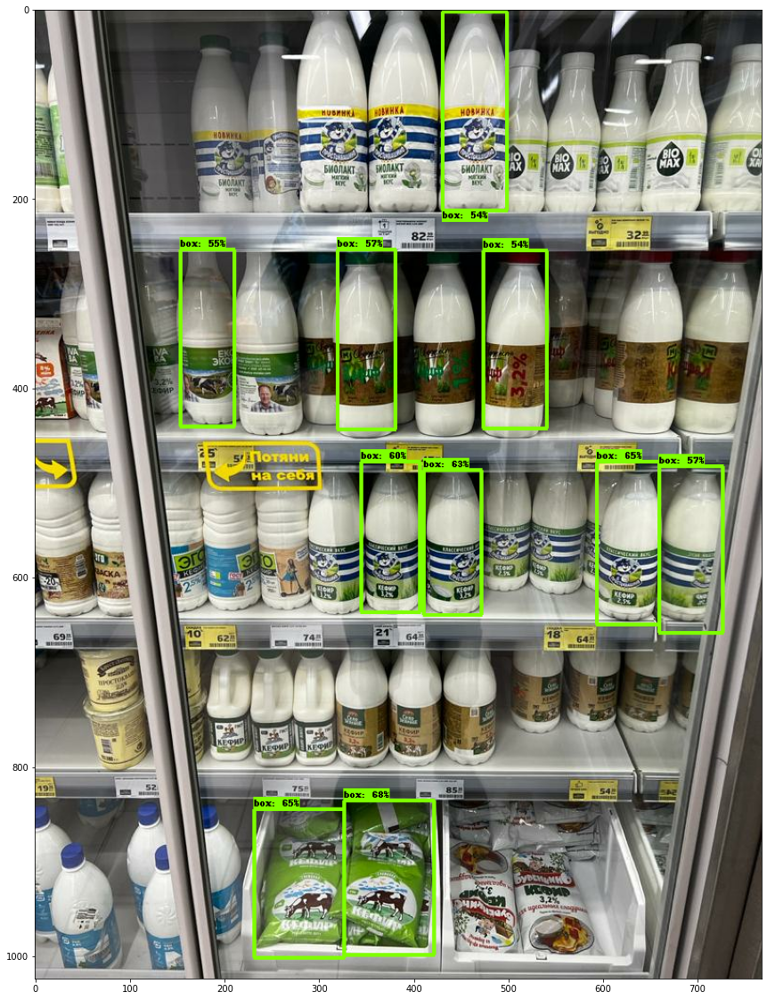

In [ ]:
# Load the TFLite model and allocate tensors.
model_path = '/content/exp_models/model.tflite'
label_map_path = '/content/label_map.txt'

# model_path = '/content/exported_models/detect.tflite copy'
# label_map_path = '/content/labelmap copy.txt'

# Initialize TensorFlow Lite Interpreter.
interpreter = tf.lite.Interpreter(model_path=model_path)
interpreter.allocate_tensors()

# Label map can be used to figure out what class ID maps to what
# label. `label_map.txt` is human-readable.
category_index = label_map_util.create_category_index_from_labelmap(
    label_map_path)

label_id_offset = 1

# image = tf.io.read_file(image_path)
image = tf.io.read_file('/content/952673a7-IMG-20211001-WA0012.jpg')
image = tf.compat.v1.image.decode_jpeg(image)
image = tf.expand_dims(image, axis=0)
image_numpy = image.numpy()

input_tensor = tf.convert_to_tensor(image_numpy, dtype=tf.float32)
# Note that CenterNet doesn't require any pre-processing except resizing to the
# input size that the TensorFlow Lite Interpreter was generated with.
input_tensor = tf.image.resize(input_tensor, (512, 512))
input_tensor = tf.dtypes.cast(input_tensor, tf.float32)

boxes, classes, scores, num_detections = detect(interpreter, input_tensor)
# classes, num_detections, boxes, scores = detect(interpreter, input_tensor)
# scores, boxes, num_detections, classes

vis_image = plot_detections(
    image_numpy[0],
    boxes[0],
    classes[0].astype(np.uint32) + label_id_offset,
    scores[0],
    category_index)
plt.figure(figsize = (30, 20))
plt.imshow(vis_image)

#END for MobileNet

# ResNet

In [ ]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_resnet50_v2_512x512_coco17_tpu-8.tar.gz
!tar xf centernet_resnet50_v2_512x512_coco17_tpu-8.tar.gz

--2022-01-27 10:14:05--  http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_resnet50_v2_512x512_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.142.128, 2607:f8b0:400e:c08::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.142.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 237977273 (227M) [application/x-tar]
Saving to: ‘centernet_resnet50_v2_512x512_coco17_tpu-8.tar.gz’

centernet_resnet50_ 100%[===================>] 226.95M   161MB/s    in 1.4s    

2022-01-27 10:14:07 (161 MB/s) - ‘centernet_resnet50_v2_512x512_coco17_tpu-8.tar.gz’ saved [237977273/237977273]



In [ ]:
%load_ext tensorboard

In [ ]:
!rm -rf model_training
!mkdir model_training 

In [ ]:
!python models/research/object_detection/model_main_tf2.py \
  --pipeline_config_path=/content/centernet_resnet50_v2_512x512_coco17_tpu-8/pipeline.config \
  --model_dir=/content/model_training/ \
  --checkpoint_every_n=100 \
  --num_workers=2 \
  --alsologtostderr

Instructions for updating:
use distribute.MultiWorkerMirroredStrategy instead
W0127 13:22:39.257308 139840027301760 deprecation.py:347] From models/research/object_detection/model_main_tf2.py:101: _CollectiveAllReduceStrategyExperimental.__init__ (from tensorflow.python.distribute.collective_all_reduce_strategy) is deprecated and will be removed in a future version.
Instructions for updating:
use distribute.MultiWorkerMirroredStrategy instead
2022-01-27 13:22:40.370869: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Single-worker MultiWorkerMirroredStrategy with local_devices = ('/device:GPU:0',), communication = CommunicationImplementation.AUTO
I0127 13:22:40.373249 139840027301760 collective_all_reduce_strategy.py:433] Single-worker MultiWorkerMirroredStrategy with local_devices = ('/device:GPU:0',), communication = Communicati

#Eval

In [ ]:
# python models/research/object_detection/model_main_tf2.py --pipeline_config_path=/content/centernet_resnet50_v2_512x512_coco17_tpu-8/pipeline.config --model_dir=/content/model_training/ --checkpoint_dir=/content/model_training --eval_timeout=10 --run_once=True --alsologtostderr

In [ ]:
!cp -av "/content/centernet_resnet50_v2_512x512_coco17_tpu-8/pipeline.config" "/content/model_training"
!cp -av "/content/model_training" "/content/drive/MyDrive/experimental/exp14"

In [ ]:
%tensorboard --logdir=/content/drive/MyDrive/experimental/exp4

<IPython.core.display.Javascript object>

In [ ]:
!python models/research/object_detection/model_main_tf2.py \
  --pipeline_config_path=/content/centernet_resnet50_v2_512x512_coco17_tpu-8/pipeline.config \
  --model_dir=/content/model_training \
  --checkpoint_dir=/content/model_training \
  --eval_timeout=10 \
  --alsologtostderr

W0127 13:48:01.746269 140315221374848 model_lib_v2.py:1090] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I0127 13:48:01.746714 140315221374848 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0127 13:48:01.746881 140315221374848 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0127 13:48:01.747040 140315221374848 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W0127 13:48:01.747327 140315221374848 model_lib_v2.py:1111] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
2022-01-27 13:48:02.799518: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original confi

#Export

In [ ]:
!cp -av "/content/centernet_mobilenetv2_fpn_od/pipeline.config" "/content/model_dir"
!cp -av "/content/model_dir" "/content/drive/MyDrive/experimental/exp3"

'/content/centernet_mobilenetv2_fpn_od/pipeline.config' -> '/content/model_dir/pipeline.config'


In [ ]:
!rm -rf exported_models
!mkdir exported_models

In [ ]:
!python models/research/object_detection/exporter_main_v2.py \
  --pipeline_config_path=/content/drive/MyDrive/experimental/exp4/pipeline.config \
  --trained_checkpoint_dir=/content/drive/MyDrive/experimental/exp4 \
  --output_directory=/content/exported_models \
  --input_type=image_tensor

W0127 14:38:58.014556 139933620094848 mobilenet_v2.py:303] `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
2022-01-27 14:38:58.698577: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
9420800/9406464 [==============================] - 0s 0us/step
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0127 14:39:04.113759 139933620094848 deprecation.py:619] From /usr/local/lib/python3.7/dist-packages/tensorflow/python/autograph/impl/api.py:464: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with back_prop=False is deprecated and will be removed in a future ve

# Export to TFLite

In [ ]:
import tensorflow as tf

In [ ]:
!python models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {'/content/exported_models/checkpoint'} \
    --output_directory {'exported_models/tflite'} \
    --pipeline_config_path {'/content/exported_models/pipeline.config'}
    

W0127 14:40:00.112047 140222968608640 mobilenet_v2.py:303] `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
2022-01-27 14:40:00.806678: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0127 14:40:07.565715 140222968608640 save_impl.py:72] Skipping full serialization of Keras layer <object_detection.meta_architectures.center_net_meta_arch.CenterNetMetaArch object at 0x7f87240d9990>, because it is not built.
2022-01-27 14:40:22.855155: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.
INFO:tensorflow:Assets written to: exported_models/tflite/saved_model/assets
I0127 14:40:47.359022 140222968608640 builder_impl.py:784] Assets written to: exported_

In [ ]:
converter = tf.lite.TFLiteConverter.from_saved_model('/content/exported_models/tflite/saved_model')
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_model = converter.convert()

with open('/content/exported_models/model.tflite', 'wb') as f:
  f.write(tflite_model)